In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['JAX_PLATFORMS'] = 'cpu'
import yaml
import sys
sys.path.append("..")

import os.path as osp
import torch
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm_notebook as tqdm
import torch.nn as nn
from torch_model import DiT
from torch_vae import AutoencoderKL

In [2]:
yaml_path = "../shortcutmodel_args.yaml"
device = "cuda"

In [3]:
with open(yaml_path, 'r') as f:
    config = yaml.safe_load(f)
    
dit_args = config['dit_args']
dit_args["dtype"] = torch.float32
vae_args = config['vae_args']
dit_weights = config.get('dit_weights', None)#.replace("shortcut-models", "..")
vae_weights = config.get('vae_weights', None)#.replace("shortcut-models", "..")




In [4]:
dit = DiT(**dit_args).to(device)
if dit_weights is not None:
    dit.load_state_dict(torch.load(dit_weights, map_location=device))
dit.eval()
vae = AutoencoderKL(**vae_args).to(device)
if vae_weights is not None:
    vae.load_state_dict(torch.load(vae_weights, map_location=device))

In [5]:
from typing import Iterable, List, Tuple
import math

def build_step_schedule(fractions: Iterable[float],
                        step_sizes: Iterable[int],
                        *,
                        tol: float = 1e-8) -> Tuple[List[int], List[int]]:
    """
    Build two parallel lists (indices, totals) so that calling step(idx, tot)
    for each zipped pair traverses the path described by `fractions` using the
    provided `step_sizes` for each segment.

    Args:
        fractions: sequence of positive floats that sum to 1.0
        step_sizes: sequence of positive integers (e.g., 1,2,4,8,16,32,64,128).
                    Same length as fractions. Each fraction * step_size must be an integer.
        tol: tolerance for floating comparisons.

    Returns:
        (indices, totals) where len(indices) == len(totals). For each k,
        call step(indices[k], totals[k]).

    Example:
        fractions = (0.5, 0.25, 0.25)
        step_sizes = (2, 64, 128)

        -> indices = [0, 32, 33, ..., 47, 96, ..., 127]
           totals  = [2, 64, 64, ..., 64, 128, ..., 128]
    """
    fracs = list(fractions)
    sizes = list(step_sizes)
    if len(fracs) == 0:
        raise ValueError("fractions must be non-empty.")
    if len(fracs) != len(sizes):
        raise ValueError("fractions and step_sizes must have the same length.")

    # basic validity
    if any(f <= 0 for f in fracs):
        raise ValueError("All fractions must be positive.")
    if any(s <= 0 or not isinstance(s, int) for s in sizes):
        raise ValueError("All step_sizes must be positive integers.")

    ssum = sum(fracs)
    if not (abs(ssum - 1.0) <= tol):
        raise ValueError(f"fractions must sum to 1.0 (sum={ssum})")

    indices: List[int] = []
    totals: List[int] = []

    cumulative_frac = 0.0
    for f, S in zip(fracs, sizes):
        # number of steps in this segment for the given granularity S
        exact_n = f * S
        n = int(round(exact_n))
        if not (abs(exact_n - n) <= tol):
            raise ValueError(f"fraction {f} * step_size {S} must be integer (got {exact_n})")
        if n == 0:
            # allow zero-length segment only if f == 0 (we checked f>0 above), so error
            raise ValueError(f"Segment with fraction {f} and step_size {S} results in zero steps.")
        # start index in [0, S-1] (inclusive)
        start = int(round(cumulative_frac * S))
        end = start + n  # exclusive
        if end > S:
            # numerical safety: trim to S
            end = S
        # add indices start .. end-1 with total S
        for idx in range(start, end):
            indices.append(idx)
            totals.append(S)

        # advance cumulative fraction
        cumulative_frac += f

    # final checks: for the last segment, ensure last index equals S-1 of its S
    # (this should hold by construction if fractions sum to 1 and integer counts matched)
    if len(indices) == 0:
        return indices, totals

    # Remove possible duplicates and ensure monotonic within each (index,total) pair sequence:
    # (we preserve order; duplicates unlikely but handle gracefully)
    cleaned_idx = []
    cleaned_tot = []
    seen = set()
    for idx, tot in zip(indices, totals):
        key = (idx, tot)
        if key in seen:
            continue
        seen.add(key)
        cleaned_idx.append(idx)
        cleaned_tot.append(tot)

    return cleaned_idx, cleaned_tot

In [6]:
num_generations = 16
image_size = 32
in_channels = 4
num_classes = 1
cfg_scale = 0
model = dit

def rescale_img(x):
    if isinstance(x, torch.Tensor):
        x = np.array(x.detach().cpu().numpy())
    shape = x.shape
    if len(shape) == 4 and shape[1] == 3:
        x = x.transpose(0, 2, 3, 1)
    elif len(shape) == 3 and shape[0] == 3:
        x = x.transpose(1, 2, 0)
    x = x * 0.5 + 0.5  # [-1,1] to [0,1]
    x = np.clip(x, 0, 1)
    x = (x * 255).astype(np.uint8)
    return x

def decode(x, rescale=True):
    if not isinstance(x, np.ndarray):
        x = x.detach().cpu().numpy()
    x_torch = torch.Tensor(x).to(device)
    x_decoded = vae.decode(x_torch)
    if not rescale:
        return x_decoded
    return rescale_img(x_decoded)

def step(x, ti, denoise_timesteps, labels):
    batch_size = x.shape[0]
    delta_t = 1.0 / denoise_timesteps
    t = ti / denoise_timesteps
    t_vector = torch.full((batch_size,), t, dtype=torch.float32, device=device)
    dt_flow = int(np.log2(denoise_timesteps))
    dt_base = torch.ones(batch_size, dtype=torch.float32, device=device) * dt_flow

    # Classifier-free guidance
    labels_uncond = torch.ones_like(labels) * num_classes
    if cfg_scale == 1:
        v, *_ = model(x, t_vector, dt_base, labels)
    elif cfg_scale == 0:
        v, *_ = model(x, t_vector, dt_base, labels_uncond)
    else:
        v_pred_uncond, *_ = model(x, t_vector, dt_base, labels_uncond)
        v_pred_label, *_ = model(x, t_vector, dt_base, labels)
        v = v_pred_uncond + cfg_scale * (v_pred_label - v_pred_uncond)

    # Euler sampling
    x = x + v * delta_t
    return x
    
def generate(batch_size, num_generations, inputs, fractions, step_sizes, show_progress=True, tol=1e-8, return_inter=False):
    all_images = []
    inters = {}
    if inputs is None:
        inputs = np.random.randn(num_generations, in_channels, image_size, image_size).astype(np.float32)
    else:
        num_generations = len(inputs)
    with torch.no_grad():
        for gen_idx in tqdm(range(num_generations // batch_size)):
            # Sample initial noise in latent space
            x = inputs[gen_idx*batch_size: (gen_idx+1)*batch_size]
            x = torch.Tensor(x).to(device)
            labels = torch.randint(0, num_classes, (batch_size,), device=device)
            schedule = list(zip(*build_step_schedule(fractions, step_sizes, tol=tol)))
            if show_progress:
                schedule = tqdm(schedule)
            for ti, dts in schedule:
                if return_inter and ti==0:
                    decoded = decode(x)
                    k = (0, dts)
                    inters.setdefault(k, [])
                    inters[k].append(decoded)
                x = step(x, ti, dts, labels)
                if return_inter:
                    decoded = decode(x)
                    k = (ti+1, dts)
                    inters.setdefault(k, [])
                    inters[k].append(decoded)
            # VAE decode (Torch)
            # x: (B, H, W, C) -> (B, C, H, W)
            x_img = decode(x)
            all_images.append(x_img)
    
        all_images = np.concatenate(all_images, axis=0)
        
    if return_inter:
        return all_images, inters
    return all_images

## Apply Same Fourier Implementation to Operator and Back Projection

In [7]:
sys.path.append("../../resample")
from ldm_inverse.measurements import get_noise, get_operator

In [8]:
import torch.nn.functional as F
import torch.fft as fft
def gaussian_kernel(kernel_size=61, sigma=3.0, channels=3, device='cuda'):
    """
    Create a 2D Gaussian kernel for convolution
    """
    ax = torch.arange(-kernel_size // 2 + 1., kernel_size // 2 + 1., device=device)
    xx, yy = torch.meshgrid(ax, ax, indexing='ij')
    kernel = torch.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel = kernel / kernel.sum()
    kernel = kernel.view(1, 1, kernel_size, kernel_size)
    kernel = kernel.repeat(channels, 1, 1, 1)  # multi-channel
    return kernel

    
import torch
import torch.nn.functional as F
import torch.fft as fft


def pad_and_shift_kernel(kernel, H, W):
    """
    Pads kernel to (H, W) centered, then ifftshifts it so that FFT interprets
    the kernel's center at the origin (0,0). This prevents circular shifts.
    """
    kh, kw = kernel.shape[-2:]

    pad_h = H - kh
    pad_w = W - kw

    # Centered padding
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left

    kernel_padded = F.pad(kernel, (pad_left, pad_right, pad_top, pad_bottom))

    # Move kernel center to (0,0) for FFT convolution
    kernel_shifted = fft.ifftshift(kernel_padded, dim=(-2, -1))

    return kernel_shifted


def solve_bp_fft_operator(y, x0, kernel, rho=1.0, eps=1e-12):
    """
    Solves: x = (A^T A + rho I)^-1 (A^T y + rho x0)
    where A is convolution with kernel k.

    All FFT operations are done with correct kernel centering to avoid shifts.
    """

    B, C, H, W = y.shape

    # Pad+shift kernel correctly for FFT convolution
    kernel = kernel.reshape(C, 1, *kernel.shape[-2:])  # allow per-channel
    kernel_padded = pad_and_shift_kernel(kernel, H, W)  # shape: (C,1,H,W)

    # If C channels but kernel has 1, broadcast
    if kernel_padded.shape[0] == 1 and C > 1:
        kernel_padded = kernel_padded.repeat(C, 1, 1, 1)

    # Compute FFT of kernel (adjoint via conj)
    k_f = fft.rfft2(kernel_padded.reshape(C, H, W))   # (C, H, W/2+1)

    # Expand kernel to batch dimension
    k_f = k_f.unsqueeze(0).repeat(B, 1, 1, 1)         # (B,C,H,W/2+1)
    k_f = k_f.reshape(B * C, H, W // 2 + 1)

    # FFT of inputs
    y_f  = fft.rfft2(y.reshape(B * C, H, W))
    x0_f = fft.rfft2(x0.reshape(B * C, H, W))

    # Numerator: K* ⊙ Y + rho X0
    numerator = torch.conj(k_f) * y_f + rho * x0_f

    # Denominator: |K|^2 + rho
    denominator = (k_f.abs() ** 2) + rho + eps

    # Solve per-frequency
    x_f = numerator / denominator

    # Back to spatial domain
    x = fft.irfft2(x_f, s=(H, W))
    x = x.reshape(B, C, H, W)

    return x

def solve_bp_fft_operator2(y, x0, kernel, rho=1.0, eps=1e-12):
    """
    Solves: x = (A^T A + rho I)^-1 (A^T y + rho x0)
    where A is convolution with kernel k.

    All FFT operations are done with correct kernel centering to avoid shifts.
    """

    B, C, H, W = y.shape

    # Prepare kernel
    if kernel.ndim == 2:  # (kh, kw)
        kernel = kernel.unsqueeze(0)  # -> (1, kh, kw)
    
    # Pad and shift kernel for FFT convolution
    kernel_reshaped = kernel.reshape(kernel.shape[0], 1, *kernel.shape[-2:])
    kernel_padded = pad_and_shift_kernel(kernel_reshaped, H, W)
    
    # Broadcast kernel if needed
    if kernel_padded.shape[0] == 1 and C > 1:
        kernel_padded = kernel_padded.repeat(C, 1, 1, 1)

    # Compute FFT of kernel (adjoint via conj)
    k_f = fft.rfft2(kernel_padded.reshape(C, H, W))   # (C, H, W/2+1)

    # Expand kernel to batch dimension
    k_f = k_f.unsqueeze(0).repeat(B, 1, 1, 1)         # (B,C,H,W/2+1)
    k_f = k_f.reshape(B * C, H, W // 2 + 1)

    # FFT of inputs
    y_f  = fft.rfft2(y.reshape(B * C, H, W))
    x0_f = fft.rfft2(x0.reshape(B * C, H, W))

    # Numerator: K* ⊙ Y + rho X0
    numerator = torch.conj(k_f) * y_f + rho * x0_f

    # Denominator: |K|^2 + rho
    denominator = (k_f.abs() ** 2) + rho + eps

    # Solve per-frequency
    x_f = numerator / denominator

    # Back to spatial domain
    x = fft.irfft2(x_f, s=(H, W))
    x = x.reshape(B, C, H, W)

    return x

def apply_convolution_operator(image, kernel):
    """
    Apply convolution operator A to an image using FFT: y = A * x
    
    Parameters:
    -----------
    image : torch.Tensor
        Input image of shape (B, C, H, W) or (C, H, W) or (H, W)
    kernel : torch.Tensor
        Convolution kernel of shape (kh, kw) or (C, kh, kw)
        
    Returns:
    --------
    torch.Tensor
        Convolved image, same shape as input
    """
    # Handle different input shapes
    original_shape = image.shape
    
    if image.ndim == 2:  # (H, W)
        image = image.unsqueeze(0).unsqueeze(0)  # -> (1, 1, H, W)
    elif image.ndim == 3:  # (C, H, W)
        image = image.unsqueeze(0)  # -> (1, C, H, W)
    
    B, C, H, W = image.shape
    
    # Prepare kernel
    if kernel.ndim == 2:  # (kh, kw)
        kernel = kernel.unsqueeze(0)  # -> (1, kh, kw)
    
    # Pad and shift kernel for FFT convolution
    kernel_reshaped = kernel.reshape(kernel.shape[0], 1, *kernel.shape[-2:])
    kernel_padded = pad_and_shift_kernel(kernel_reshaped, H, W)
    
    # Broadcast kernel if needed
    if kernel_padded.shape[0] == 1 and C > 1:
        kernel_padded = kernel_padded.repeat(C, 1, 1, 1)
    
    # Compute FFT of kernel
    k_f = fft.rfft2(kernel_padded.reshape(C, H, W))
    
    # Expand to batch dimension
    k_f = k_f.unsqueeze(0).repeat(B, 1, 1, 1)  # (B, C, H, W/2+1)
    k_f = k_f.reshape(B * C, H, W // 2 + 1)
    
    # FFT of image
    x_f = fft.rfft2(image.reshape(B * C, H, W))
    
    # Apply convolution in frequency domain
    y_f = k_f * x_f
    
    # Back to spatial domain
    y = fft.irfft2(y_f, s=(H, W))
    y = y.reshape(B, C, H, W)
    
    # Restore original shape
    if len(original_shape) == 2:
        y = y.squeeze(0).squeeze(0)
    elif len(original_shape) == 3:
        y = y.squeeze(0)
    
    return y



import torch
from PIL import Image
import torchvision.transforms as transforms
import numpy as np


def read_image_to_tensor(image_path, normalize=True, device='cpu'):
    """
    Read an image file and convert it to a PyTorch tensor.
    
    Args:
        image_path (str): Path to the image file
        normalize (bool): If True, normalize pixel values to [-1, 1]. Default: True
        device (str): Device to place the tensor on ('cpu' or 'cuda'). Default: 'cpu'
    
    Returns:
        torch.Tensor: Image tensor of shape (C, H, W) with values in [0, 1] if normalized,
                     or [0, 255] if not normalized
    
    Example:
        >>> img_tensor = read_image_to_tensor('path/to/image.jpg')
        >>> print(img_tensor.shape)  # (3, H, W)
    """
    # Read image using PIL
    image = Image.open(image_path).convert('RGB')
    
    # Convert to tensor
    if normalize:
        # Normalize to [-1, 1]
        transform = transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
        img_tensor = transform(image)
    else:
        # Keep as [0, 255]
        img_array = np.array(image)
        img_tensor = torch.from_numpy(img_array).permute(2, 0, 1).float()
    
    # Move to specified device
    img_tensor = img_tensor.to(device)
    
    return img_tensor[None, ...]

def to_numpy(t):
    if t.shape[0] == 1:
        t = t[0]
    if len(t.shape) == 3:
        t = t.permute(1, 2, 0)
    else:
        t = t.permute(0, 2, 3, 1)
    n = torch.clamp((t * 0.5 + 0.5) * 255, 0, 255)
    n = n.detach().cpu().numpy().astype("uint8")
    return n

In [9]:
Blurkernel?

Object `Blurkernel` not found.


In [10]:
from util.img_utils import Blurkernel
measure_config = {"operator" : {"blur_type": "gaussian",
                                    "kernel_size": 61,
                                    "std": 3.0},
                      "noise": {"name": "gaussian",
                                "sigma": 0.01}
                     }
device = "cuda:0"

kernel = Blurkernel(**measure_config["operator"],
                   device=device).get_kernel().to(device)


noiser = get_noise(**measure_config['noise'])


### Compart Torch Blur + Fourier BP to Fourier Round Trip
Artifacts gone when using the same Fourier implementation to blur the image and to restore it using BP

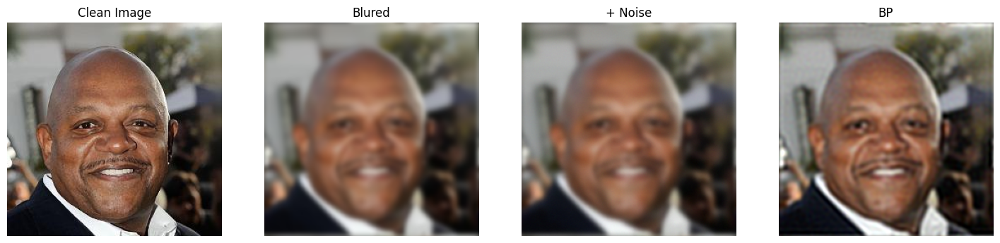

In [11]:
imgp = "../../resample/data/celebs/celebahq_0009.jpg"

# Read an image to a tensor, normalized to [-1, 1]
img = read_image_to_tensor(imgp, device=device)

# Get a measurement image by applying the operator using Fourier transform and adding the noise
y = apply_convolution_operator(img, kernel)
y_n = noiser(y).to(device)

# x_hat and xf_hat are the results of applying BP on y_n and yf_n where BP is implemented with Fourier
x_hat = solve_bp_fft_operator2(y_n, y_n*0, kernel, rho=0.005, eps=1e-12)

fig, ax = plt.subplots(1, 4, figsize=(3*6, 1*6))
fourier_data = [img, y, y_n, x_hat]
titles = ["Clean Image",  "Blured", "+ Noise", "BP"]
for axx, m_data, tit in zip(ax, fourier_data, titles):
    axx.imshow(to_numpy(m_data))
    axx.set_title(tit)
    axx.axis("off")


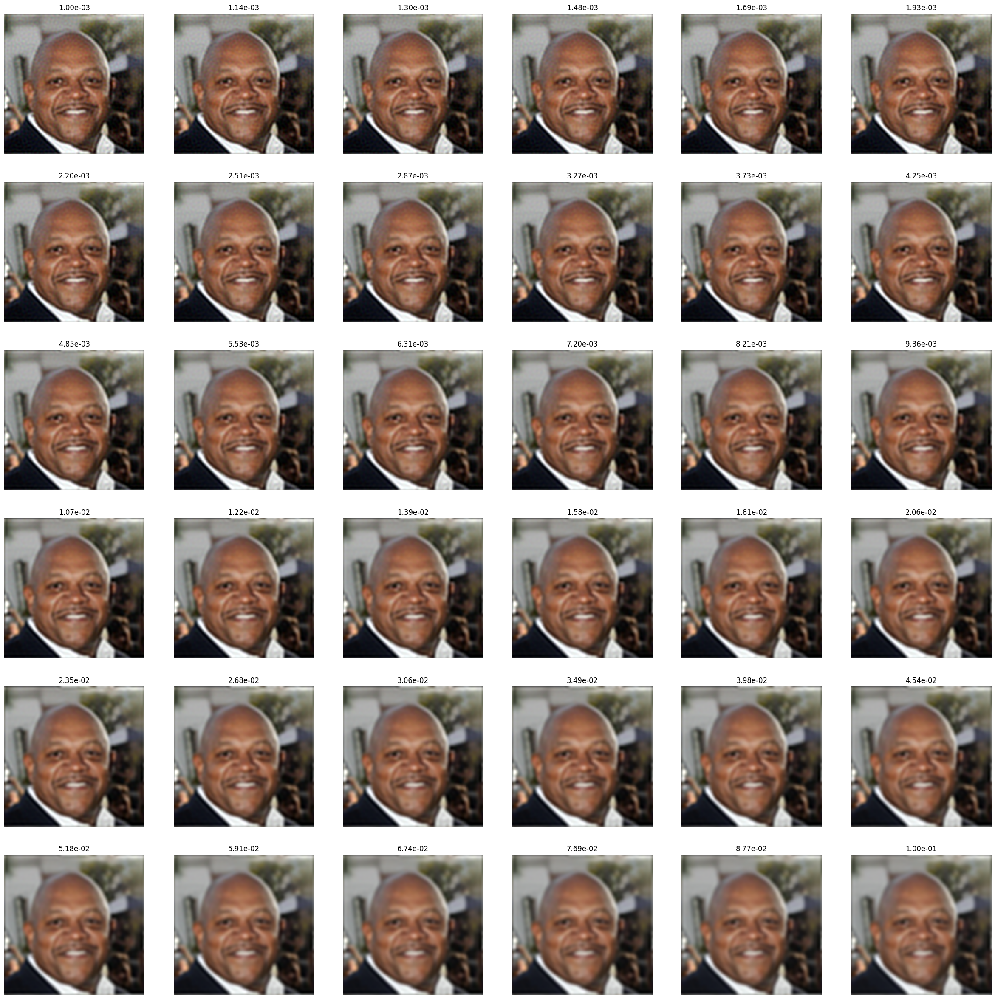

In [12]:
cols =6
rows = 6
N = rows*cols
rhos = np.logspace(-3, -1, N)
fig, ax = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
for rho, axx in zip(rhos, ax.flatten()):
    x_hat = solve_bp_fft_operator2(y_n, y_n*0, kernel, rho=rho, eps=1e-12)
    axx.imshow(to_numpy(x_hat))
    axx.set_title(f"{rho:.2e}")
    axx.axis("off")

    

In [13]:
def encode(img, normalize=True):
    if normalize:
        img = img / 255.0
        img = img - 0.5
    img = img.float()
    return vae.encode(img)

def stochastic_encoding(img, ti, dts, noise=None):
    if noise is None:
        noise = torch.randn_like(img)
    t = ti/dts
    return t*img + (1-t)*noise

    

In [14]:
bb_latent = encode(x_hat, False)


In [15]:
dts =16
ti=10
st_encoded = stochastic_encoding(bb_latent, ti, dts)
labels = torch.randint(0, num_classes, (bb_latent.shape[0],), device=device)
res = [st_encoded]
for i in range(ti, dts):
    step_out = step(res[-1], i, dts, labels)
    print(step_out.min(), step_out.max())
    res.append(step_out)

    


tensor(-4.1568, device='cuda:0', grad_fn=<MinBackward1>) tensor(4.2202, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(-4.3871, device='cuda:0', grad_fn=<MinBackward1>) tensor(4.4981, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(-4.6141, device='cuda:0', grad_fn=<MinBackward1>) tensor(4.7811, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(-4.8392, device='cuda:0', grad_fn=<MinBackward1>) tensor(5.0685, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(-5.0658, device='cuda:0', grad_fn=<MinBackward1>) tensor(5.3576, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(-5.2972, device='cuda:0', grad_fn=<MinBackward1>) tensor(5.6430, device='cuda:0', grad_fn=<MaxBackward1>)


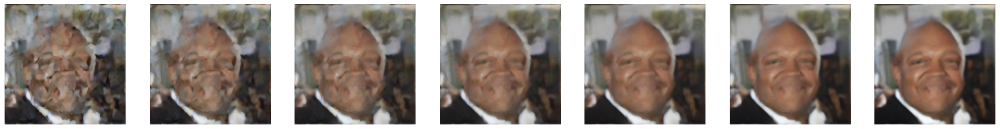

In [16]:
fig, ax = plt.subplots(1, len(res), figsize=(4*len(res), 4))
for idx, r in enumerate(res):
    dec_r = decode(r)
    ax[idx].imshow(dec_r[0])
    ax[idx].axis("off")
    

# With data fidelity step

In [18]:
labels = torch.randint(0, num_classes, (bb_latent.shape[0],), device=device)

dts=64
ti=58

z_t = stochastic_encoding(bb_latent, ti, dts)
zs = [to_numpy(decode(z_t, False))]
xp = []
xd =[]
for i in range(ti, dts):
    z_prev = step(z_t, i, dts, labels)
    x_prev = decode(z_prev, False)
    xp.append(to_numpy(x_prev))
    print(x_prev.shape)
    x_data = solve_bp_fft_operator2(y_n, x_prev, kernel, rho=0.1, eps=1e-12)
    xd.append(to_numpy(x_data))
    z_data = encode(x_data, False)
    z_t = stochastic_encoding(z_data, dts-1, dts)
    zs.append(to_numpy(decode(z_t, False)))


torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])


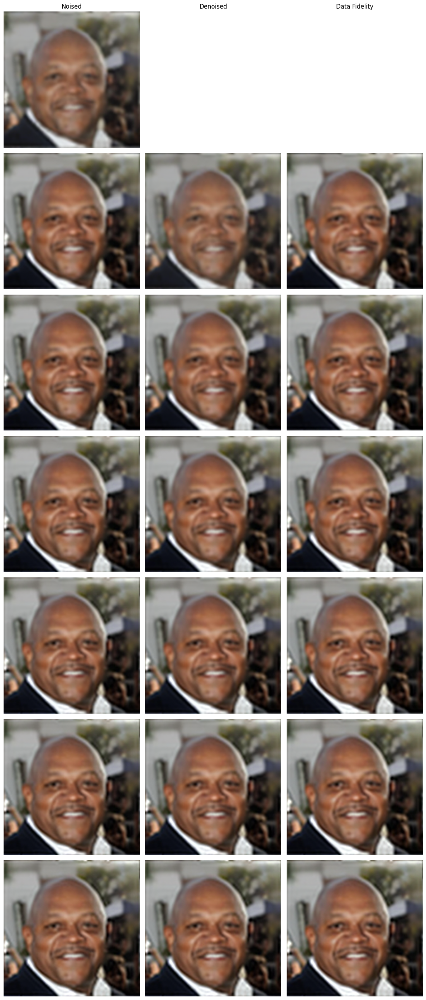

In [19]:
def display_triplet_grid(zs, xp, xd, t: float,
                         figsize = None,
                         cmap = None,
                         save_path = None):
    """
    Display images in a grid with 3 columns and len(zs) rows.

    Layout:
    - rows = len(zs)
    - columns = ["Noised", "Denoised", "Data Fidelity"]
    - row 0: left column shows zs[0], middle/right are empty
    - row r (>=1): left=zs[r], middle=xp[r-1], right=xd[r-1]

    Row labels:
    - row 0 label: `t={t}`
    - row r (>=1) label: `t={t}+{k}/{t+len(xp)}` where k = r-1

    Parameters:
    - zs, xp, xd: sequences of images (numpy arrays, torch tensors, or PIL-like)
      with len(zs) == len(xp) + 1 == len(xd) + 1
    - t: numeric parameter used in row labels
    - figsize: optional matplotlib figsize
    - cmap: colormap for single-channel images
    - save_path: optional path to save the figure
    """
    if not (len(zs) == len(xp) + 1 == len(xd) + 1):
        raise ValueError("Expected len(zs) == len(xp) + 1 == len(xd) + 1")

    nrows = len(zs)
    ncols = 3

    if figsize is None:
        figsize = (4 * ncols, max(2, nrows)*4)

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)

    # Normalize axes shape (when nrows == 1 matplotlib returns 1D axes)
    if nrows == 1:
        axes = np.expand_dims(axes, 0)

    col_titles = ["Noised", "Denoised", "Data Fidelity"]
    for c, title in enumerate(col_titles):
        axes[0, c].set_title(title)

    for r in range(nrows):
        # Left column: always zs[r]
        ax_left = axes[r, 0]
        img_z = zs[r]
        ax_left.imshow(img_z)
        ax_left.axis('off')

        # Label for the row
        if r == 0:
            label = f"t={t}"
        else:
            k = r - 1
            denom = t + len(xp)
            label = f"t={t}+{k}/{denom}"
        ax_left.set_ylabel(label, rotation=0, labelpad=40, va='center')

        if r == 0:
            # middle and right empty
            axes[r, 1].axis('off')
            axes[r, 2].axis('off')
        else:
            ax_mid = axes[r, 1]
            ax_right = axes[r, 2]

            img_p = xp[r - 1]
            img_d = xd[r - 1]


            ax_mid.imshow(img_p)
            ax_mid.axis('off')

            ax_right.imshow(img_d)
            ax_right.axis('off')

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches='tight')
    plt.show()
    
display_triplet_grid(zs, xp, xd, ti)

In [ ]:
from typing import List, Tuple, Iterable, Optional
from collections import deque
from fractions import Fraction

def shortest_aligned_plan_to_end(current_index: int,
                                 current_total: int,
                                 allowed_totals: Optional[Iterable[int]] = None
                                ) -> Tuple[List[int], List[int]]:
    """
    Compute minimal sequence of aligned steps to reach p == 1 starting from
    p = current_index / current_total under the rule:
      - step(k, T) is allowed only when p == k / T (i.e. p * T is integer)
      - calling step(k, T) moves p -> (k + 1) / T

    Args:
      current_index: int, 0 <= current_index < current_total
      current_total: int, dyadic total (power of two) that current_index refers to
      allowed_totals: iterable of allowed totals (default: [2,4,8,16,32,64,128])

    Returns:
      (indices, totals): two parallel lists describing the calls in order.
    """
    if allowed_totals is None:
        allowed_totals = [2, 4, 8, 16, 32, 64, 128]
    allowed = sorted(set(allowed_totals))

    if current_total not in allowed:
        raise ValueError("current_total must be one of allowed_totals")

    if current_total < 2 or (current_total & (current_total - 1)) != 0:
        raise ValueError("current_total must be a power of two >= 2")
    if not (0 <= current_index < current_total):
        raise ValueError("current_index must be in [0, current_total-1]")

    start_p = Fraction(current_index, current_total)
    target = Fraction(1, 1)

    # Quick exit if somehow already at or beyond end
    if start_p >= target:
        return [], []

    # BFS over reachable p values (rationals of form (k+1)/T)
    q = deque([start_p])
    prev = {start_p: (None, None)}  # map p -> (prev_p, (idx, T))
    visited = {start_p}

    while q:
        p = q.popleft()
        # for each allowed grid T, only allow a step if p * T is integer
        for T in allowed:
            # check alignment: p * T must be integer
            if (p.numerator * T) % p.denominator != 0:
                continue
            k = (p.numerator * T) // p.denominator  # exact integer
            # k must be in [0, T-1] since p < 1
            if not (0 <= k < T):
                continue
            p_next = Fraction(k + 1, T)  # result of step(k,T)
            # only forward progress (should always be > p though)
            if p_next <= p:
                continue
            if p_next in visited:
                continue
            prev[p_next] = (p, (k, T))
            if p_next == target:
                # reconstruct path
                inds: List[int] = []
                tots: List[int] = []
                cur = p_next
                while True:
                    pprev, action = prev[cur]
                    if pprev is None:
                        break
                    k_act, T_act = action
                    inds.append(k_act)
                    tots.append(T_act)
                    cur = pprev
                inds.reverse()
                tots.reverse()
                return inds, tots
            visited.add(p_next)
            q.append(p_next)

    # If we cannot reach p == 1 with these allowed totals, raise.
    raise RuntimeError("Unable to reach end with the given allowed_totals")

shortest_aligned_plan_to_end()

In [ ]:
import os.path as osp
from glob import glob
benchmark_dir = "../../resample/results/baseline64/recon"
test_dir = "../results/tests/64_steps_gamma1_mod10/recon"
benchmarl_imgs = glob(osp.join(benchmark_dir, "*.png"))
test_imgs = glob(osp.join(test_dir, "*.png"))
orig_imgs = glob(osp.join(test_dir.replace("recon", "input"), "*.png"))

images = []
for imgp1, imgp2, imgp3 in zip(orig_imgs, benchmarl_imgs, test_imgs):
    images.append(plt.imread(imgp1))
    images.append(plt.imread(imgp2))
    images.append(plt.imread(imgp3))
all_images = np.stack(images)[..., :-1]
n = 20
indices = np.random.permutation(64)[:n]*3
indices_l = []
for i in indices:
    indices_l.append(i)
    indices_l.append(i+1)
    indices_l.append(i+2)
print(indices_l)
fig, ax = show_image_grid(all_images[indices_l], 3, figsize=(4*3, 4*n))

# images = [plt.imread("../results/integration/gamma_1/input/000_true.png"),
#         plt.imread("../results/integration/64_gamma_1/input/001_true.png"),
#     plt.imread("../results/integration/64_gamma_1/recon/000_recon.png"),
# plt.imread("../results/integration/gamma_1/recon/001_recon.png"),
# plt.imread("../../resample/results/benchmarkx2/recon/000_recon.png"),
# plt.imread("../../resample/results/benchmarkx2/recon/001_recon.png")]

# all_images = np.stack(images)[..., :-1]
# fig, ax = show_image_grid(all_images, 2)